In [1]:
import os
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import h5py

In [2]:
import scvi
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.6


In [3]:
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [4]:
adatas = [x for x in os.listdir('/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/SC1186/rawdata/') if x.endswith('.h5')]

In [5]:
adatas

['2054_00_raw_.h5',
 '2060_41_raw_.h5',
 '2070_00_raw_.h5',
 '2072_00_raw_.h5',
 '2074_00_raw_.h5',
 '2075_00_raw_.h5',
 '2094_01_raw_.h5',
 'S14_00_raw_.h5',
 'S15_00_raw_.h5',
 'S16_00_raw_.h5',
 'S17_00_raw_.h5']

In [6]:
def load_it(adata):
    samp = adata.split('_')[0]
    days = adata.split('_')[1]
    adata = sc.read_10x_h5('/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/SC1186/rawdata/' + adata)
    adata.var_names_make_unique()
    adata.obs['Patient'] = samp
    adata.obs['Days'] = days
    adata.obs['Sample'] = adata.obs['Patient'] + '_' + adata.obs['Days']
    adata.obs.index = adata.obs.index + '-' + samp + '_' + days
    return adata

In [7]:
adatas = [load_it(ad) for ad in adatas]

In [8]:
adatas

[AnnData object with n_obs × n_vars = 98896 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 64501 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 90838 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 116580 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 141204 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 52652 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 102976 × 37143
     obs: 'Patient', 'Days', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_o

In [9]:
adata = sc.concat(adatas, join='outer')

In [10]:
adata.X.shape

(1129253, 37143)

In [11]:
adata.raw = adata

In [12]:
print (adata.raw)

Raw AnnData with n_obs × n_vars = 1129253 × 37143


In [13]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2054_00,98896,37143
1,2060_41,64501,37143
2,2070_00,90838,37143
3,2072_00,116580,37143
4,2074_00,141204,37143
5,2075_00,52652,37143
6,2094_01,102976,37143
7,S14_00,140869,37143
8,S15_00,97218,37143
9,S16_00,114278,37143


In [14]:
print(adata.obs['Sample'].unique())

['2054_00' '2060_41' '2070_00' '2072_00' '2074_00' '2075_00' '2094_01'
 'S14_00' 'S15_00' 'S16_00' 'S17_00']


In [15]:
adata

AnnData object with n_obs × n_vars = 1129253 × 37143
    obs: 'Patient', 'Days', 'Sample'

In [16]:
#Remove cells with fewer than 50 expressed genes
sc.pp.filter_genes(adata, min_counts=50)

In [17]:
#Minimal UMI counts = 3
sc.pp.filter_cells(adata, min_counts=3)

In [19]:
#at least 15 genes in a cell
sc.pp.filter_cells(adata, min_genes=15) 

In [20]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2054_00,4264,9344
1,2060_41,1303,9344
2,2070_00,3498,9344
3,2072_00,5647,9344
4,2074_00,5805,9344
5,2075_00,2228,9344
6,2094_01,4867,9344
7,S14_00,6584,9344
8,S15_00,5764,9344
9,S16_00,5801,9344


In [65]:
adata

AnnData object with n_obs × n_vars = 50031 × 9344
    obs: 'Patient', 'Days', 'Sample', 'n_counts', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'n_counts'
    uns: 'log1p', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_scVI', 'X_scVI_MDE'
    obsp: 'distances', 'connectivities'

In [68]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

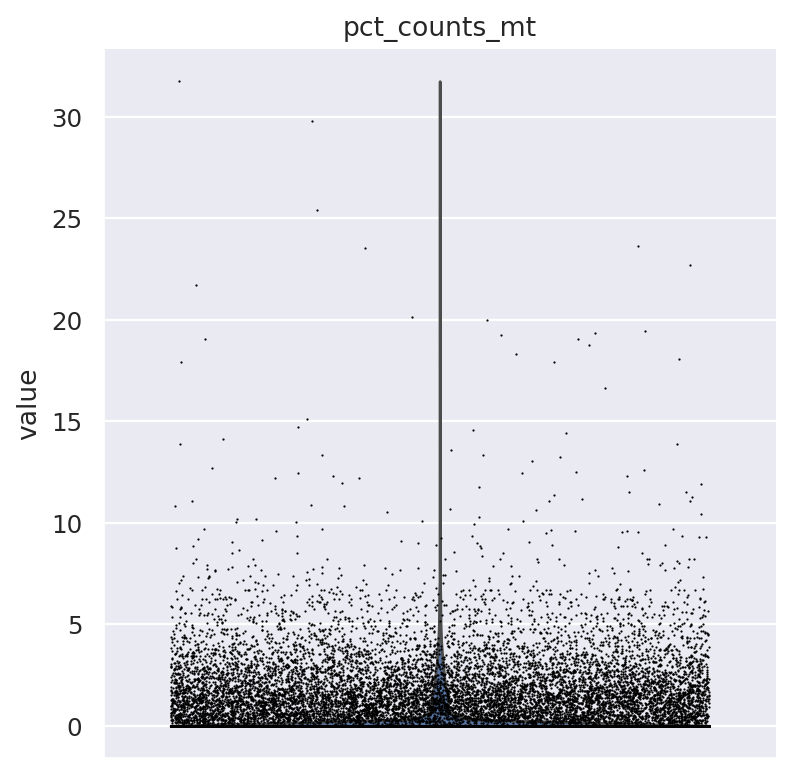

In [69]:
sc.pl.violin(adata, 'pct_counts_mt', jitter=0.4, multi_panel=True)

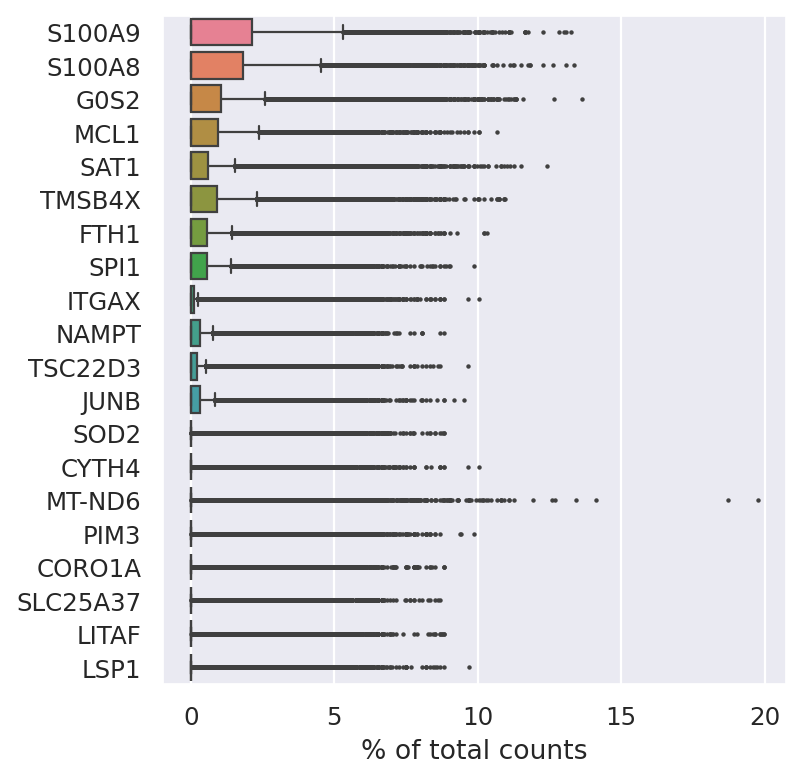

In [70]:
sc.pl.highest_expr_genes(adata, n_top=20)

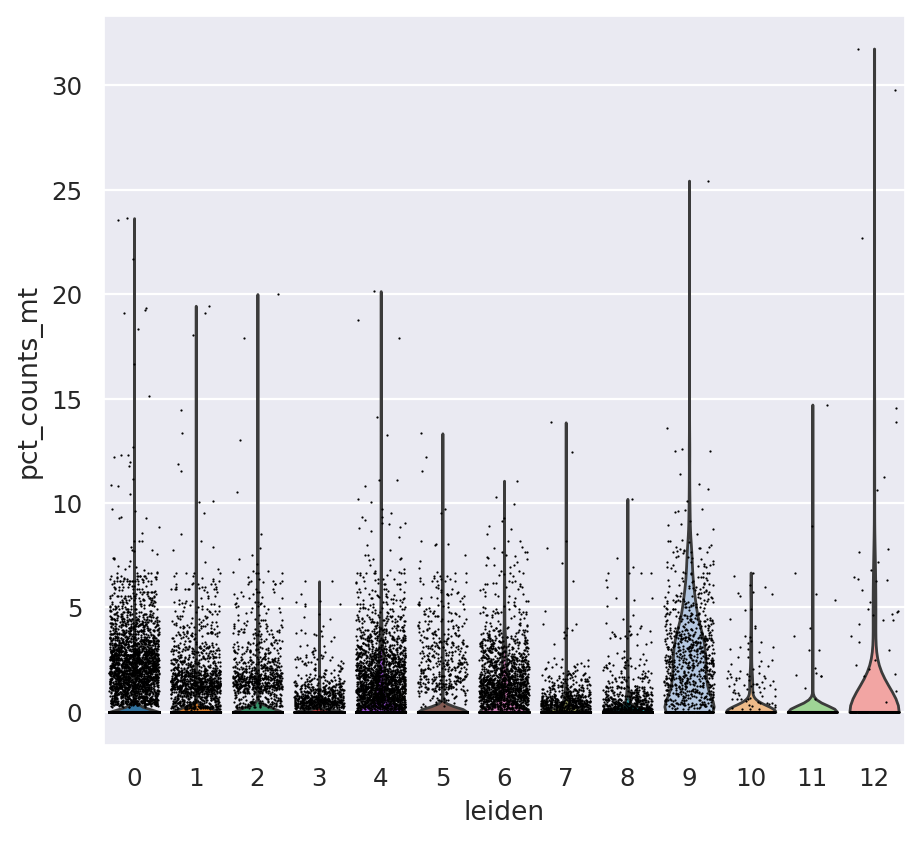

In [71]:
sc.pl.violin(adata, 'pct_counts_mt', groupby='leiden', jitter=0.4, multi_panel=True)

In [74]:
adata

AnnData object with n_obs × n_vars = 50031 × 9344
    obs: 'Patient', 'Days', 'Sample', 'n_counts', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_scVI', 'X_scVI_MDE'
    obsp: 'distances', 'connectivities'

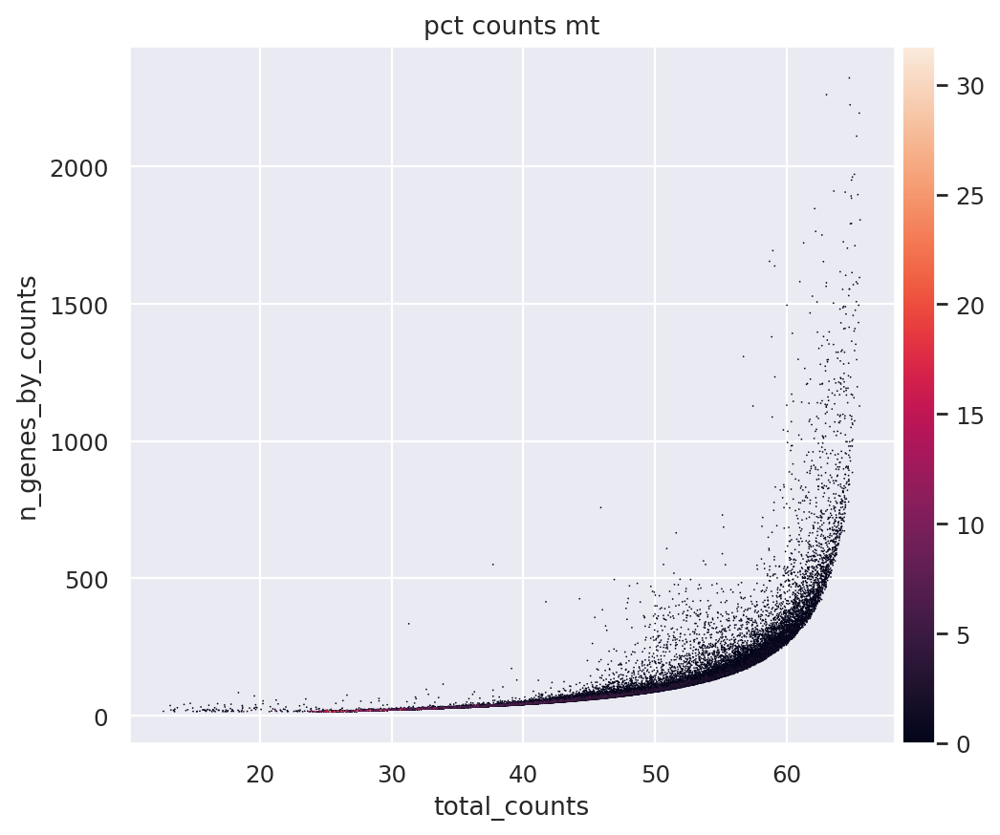

In [77]:
#UMI counts vs genes detected per cell
sc.pl.scatter(
    adata, 
    x='total_counts', 
    y='n_genes_by_counts', 
    color='pct_counts_mt', 
)

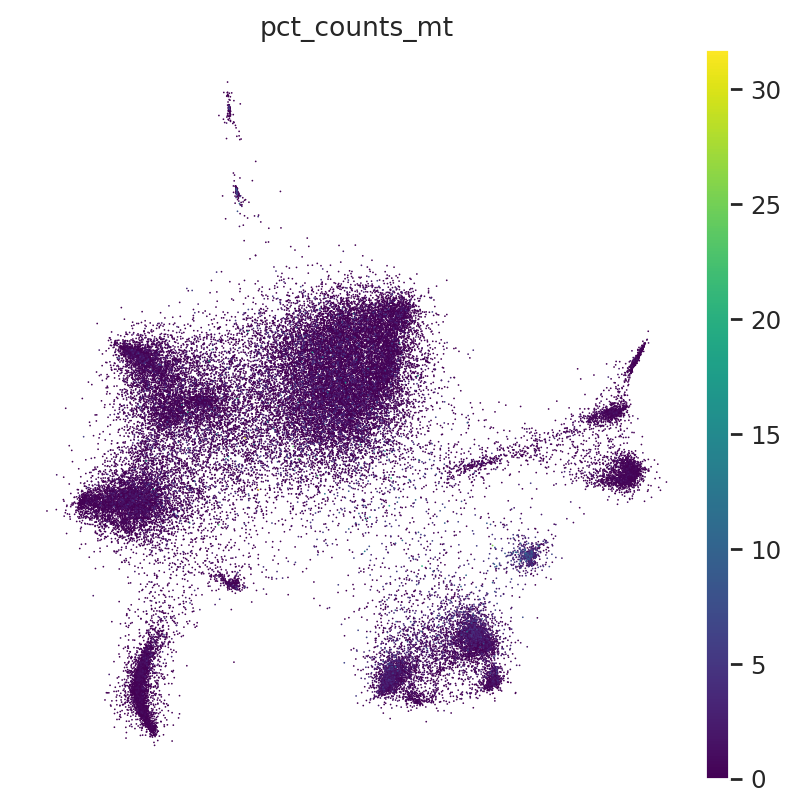

In [78]:
sc.pl.embedding(
    adata, 
    basis=SCVI_MDE_KEY,
    color='pct_counts_mt', 
    cmap='viridis', 
    frameon=False
)

In [22]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [24]:
scvi.model.SCVI.setup_anndata(adata)

In [25]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [26]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 160/160: 100%|█████| 160/160 [10:31<00:00,  3.65s/it, v_num=1, train_loss_step=205, train_loss_epoch=201]

`Trainer.fit` stopped: `max_epochs=160` reached.


Epoch 160/160: 100%|█████| 160/160 [10:31<00:00,  3.95s/it, v_num=1, train_loss_step=205, train_loss_epoch=201]


In [27]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [28]:
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata)

In [29]:
SCVI_MDE_KEY = "X_scVI_MDE"
adata.obsm[SCVI_MDE_KEY] = scvi.model.utils.mde(adata.obsm[SCVI_LATENT_KEY])

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              


In [31]:
#model.save("/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/SC1186/model")

In [ ]:
#load model

In [32]:
import torch
import tempfile
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [37]:
from IPython.display import display, HTML
display(HTML("<style>.output_area { max-height: none; }</style>"))

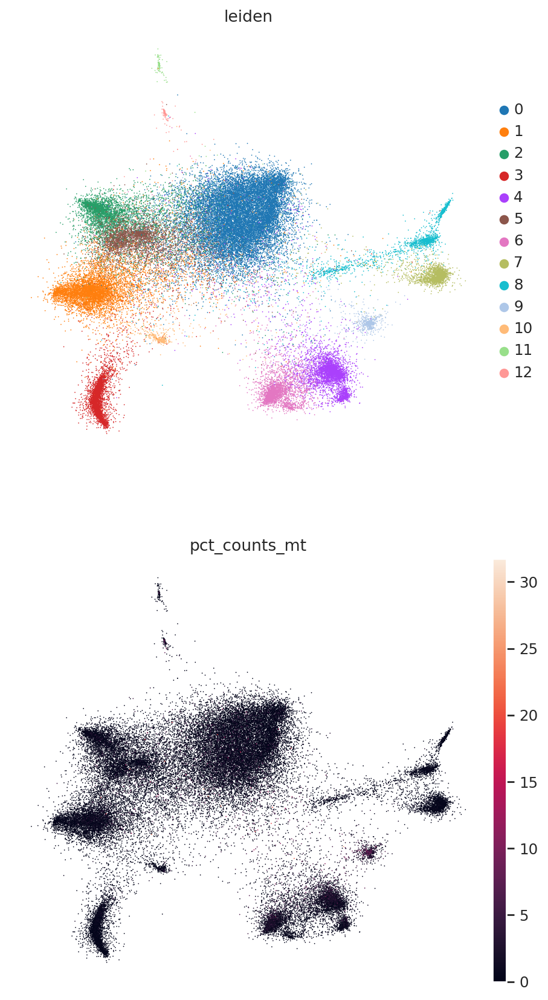

In [79]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=["leiden","pct_counts_mt"],
    frameon=False,
    ncols=1,
)

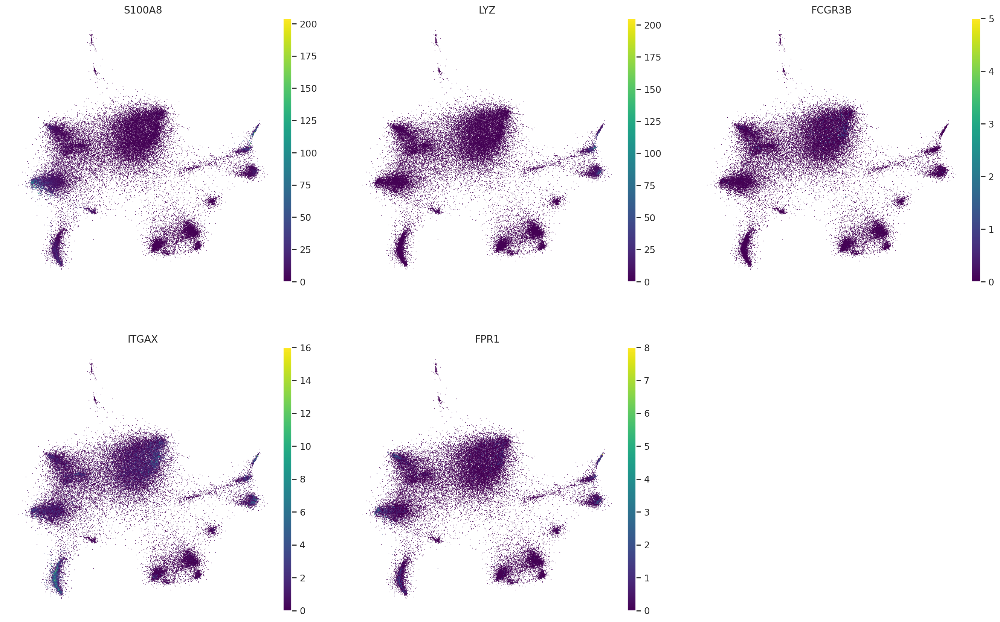

In [44]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['S100A8', 'LYZ', 'FCGR3B', 'ITGAX', 'FPR1'],
    frameon=False,
    ncols=3,
    cmap='viridis'
)


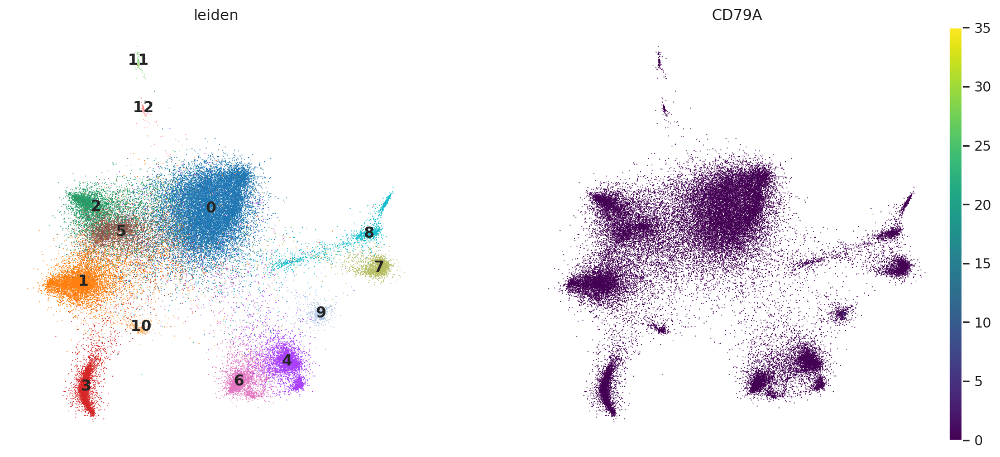

In [91]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden','CD79A'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_loc='on data',
    legend_fontsize=12
)

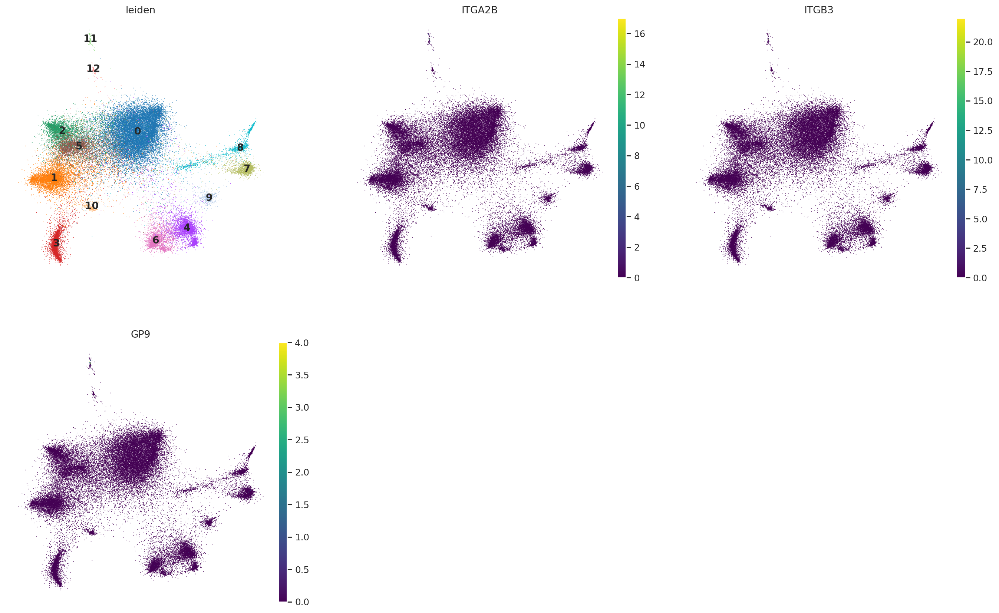

In [92]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden','ITGA2B','ITGB3','GP9'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_loc='on data',
    legend_fontsize=12
)

In [49]:
cluster_3_cells = adata[adata.obs['leiden'] == '3']

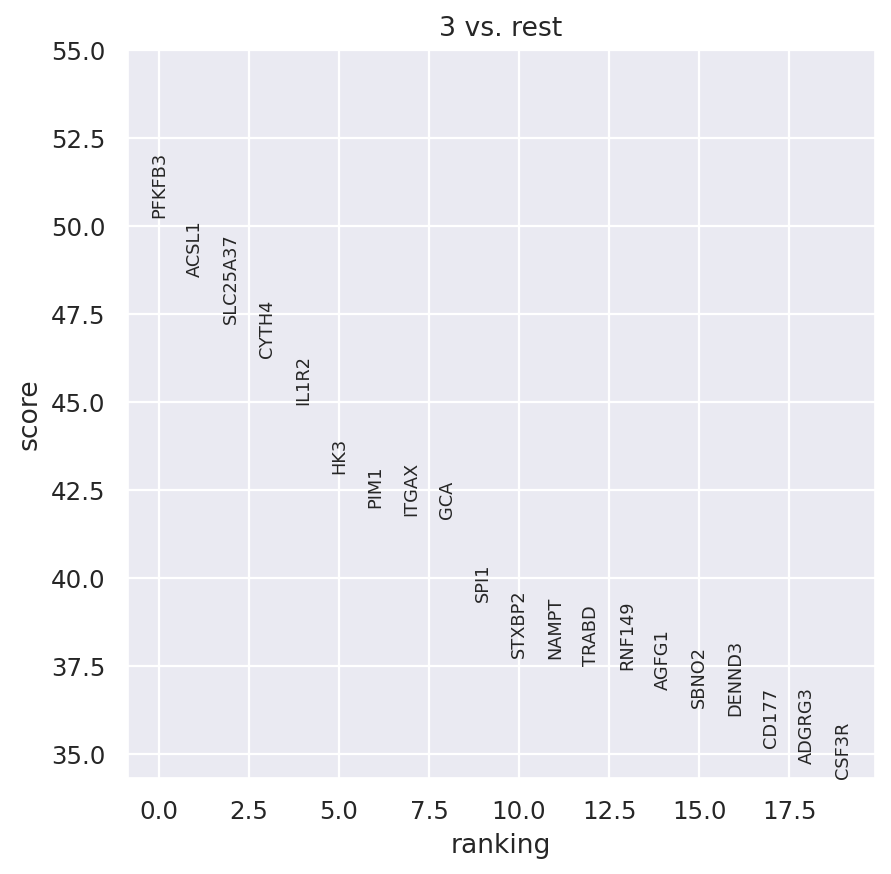

In [50]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['3'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [54]:
cluster_0_cells = adata[adata.obs['leiden'] == '0']

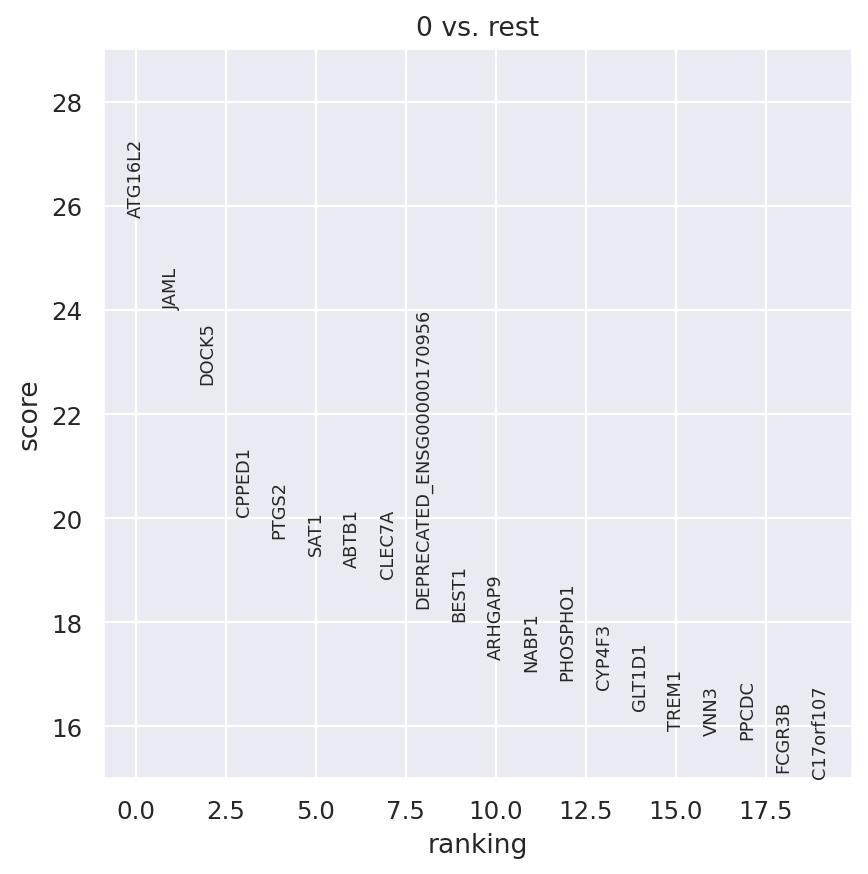

In [55]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [56]:
cluster_1_cells = adata[adata.obs['leiden'] == '1']

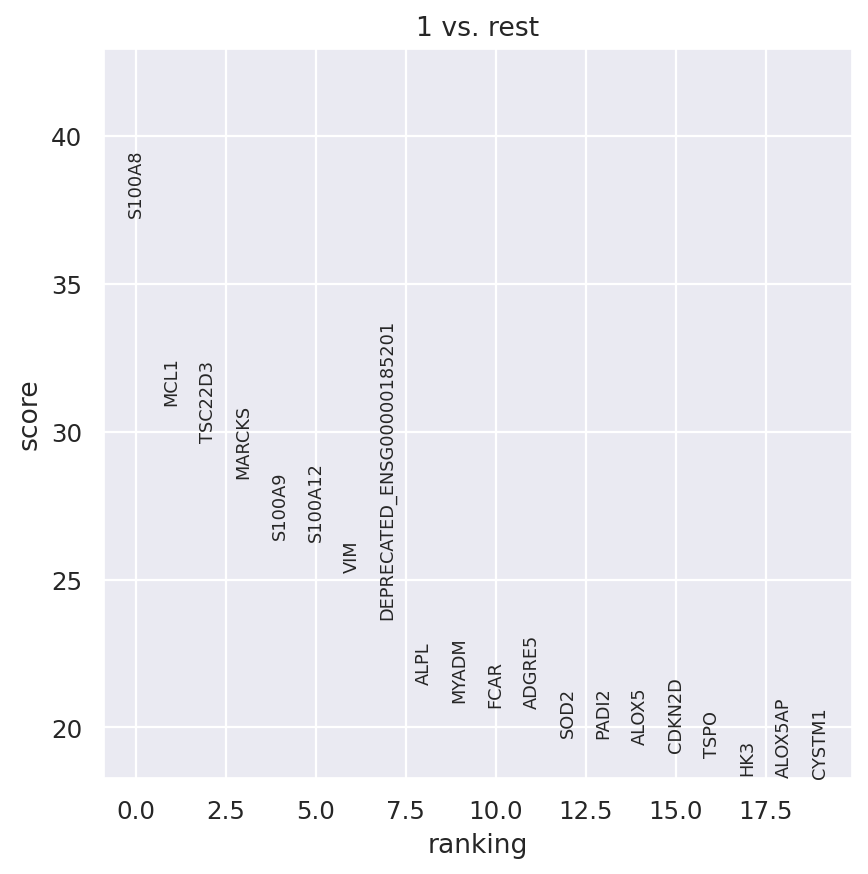

In [57]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['1'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [58]:
cluster_2_cells = adata[adata.obs['leiden'] == '2']

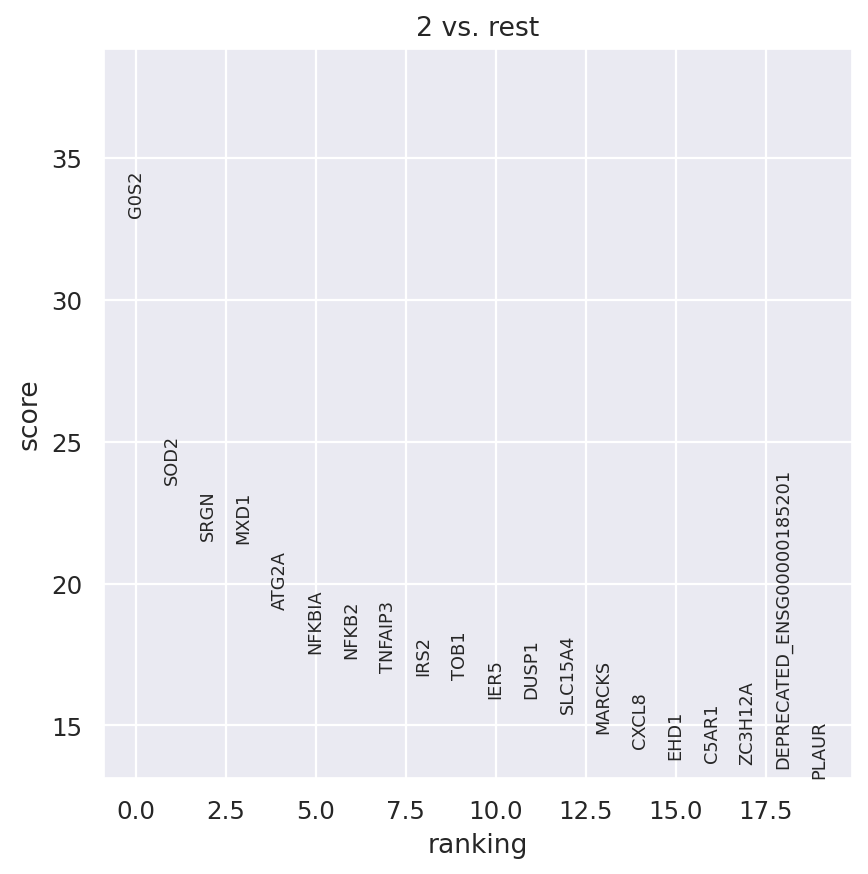

In [59]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['2'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

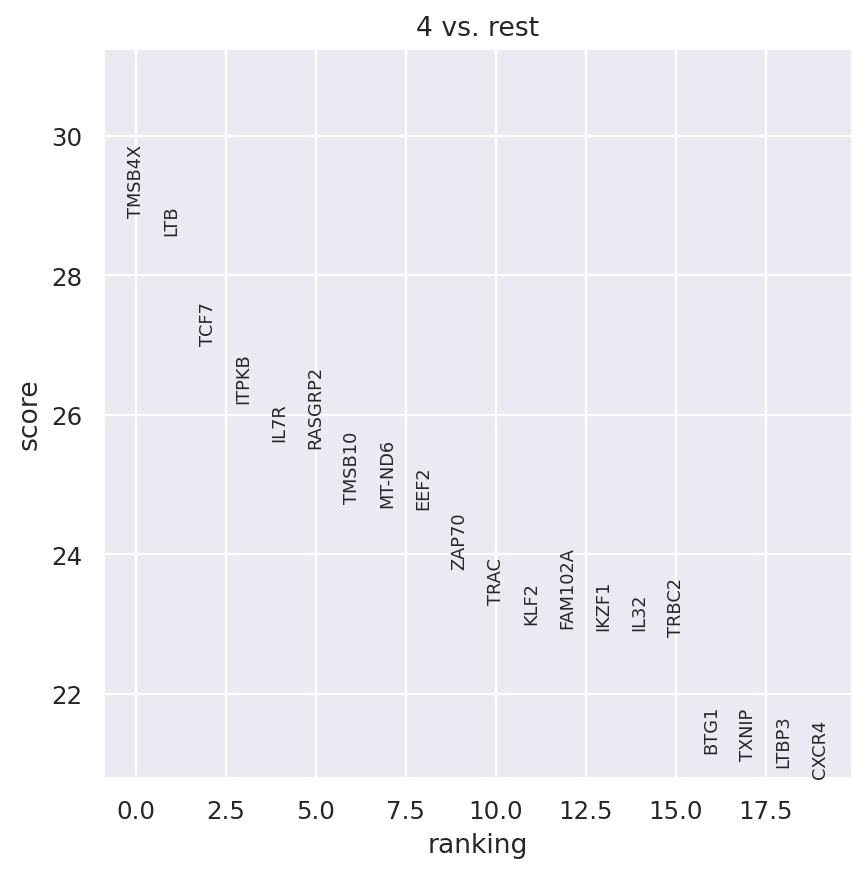

In [61]:
#IL7R(cd127) LTB TMSB4X -- T (naive and memory) cells
cluster_4_cells = adata[adata.obs['leiden'] == '4']
sc.tl.rank_genes_groups(adata, 'leiden', groups=['4'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

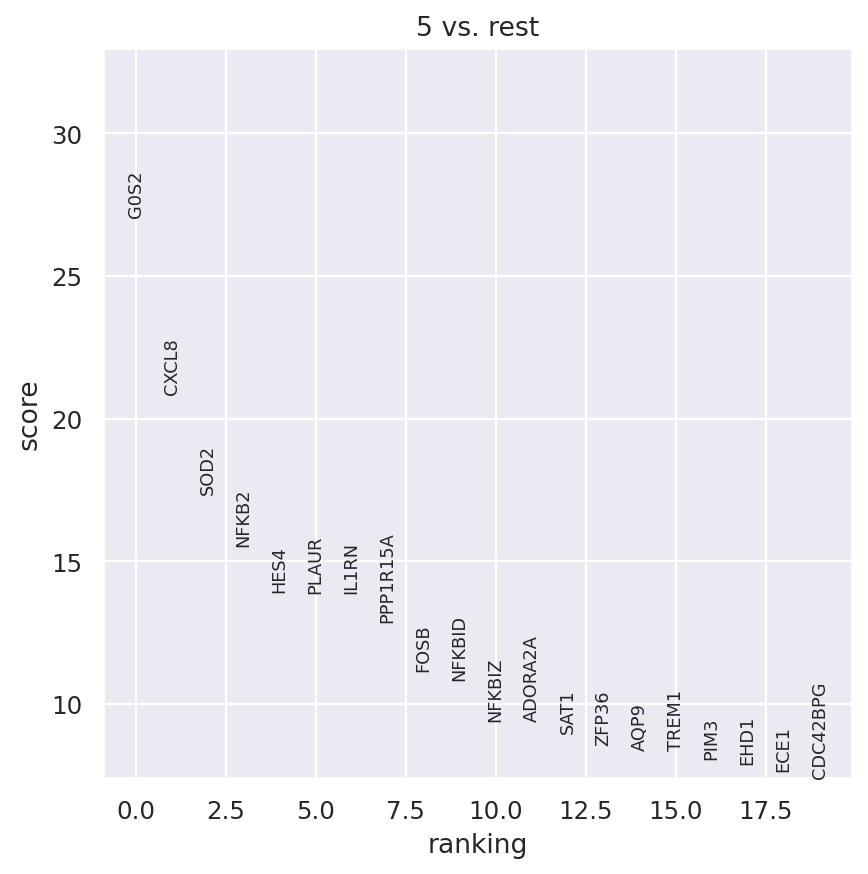

In [63]:
#
cluster_5_cells = adata[adata.obs['leiden'] == '5']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['5'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

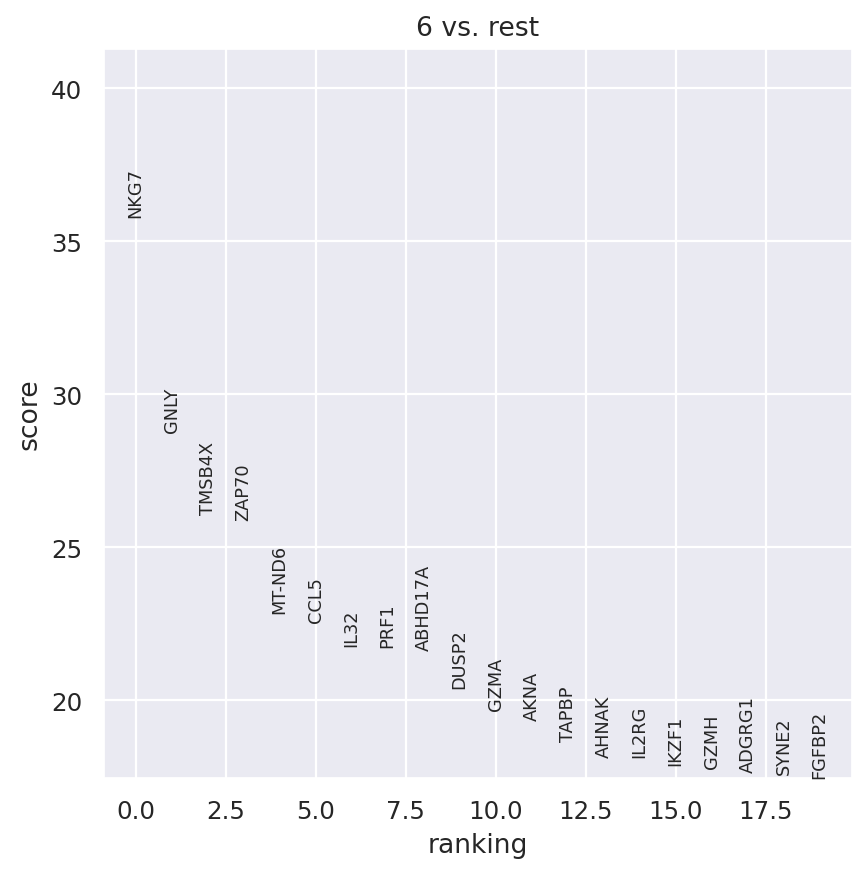

In [64]:
#NK cells(6)
cluster_6_cells = adata[adata.obs['leiden'] == '6']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['6'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

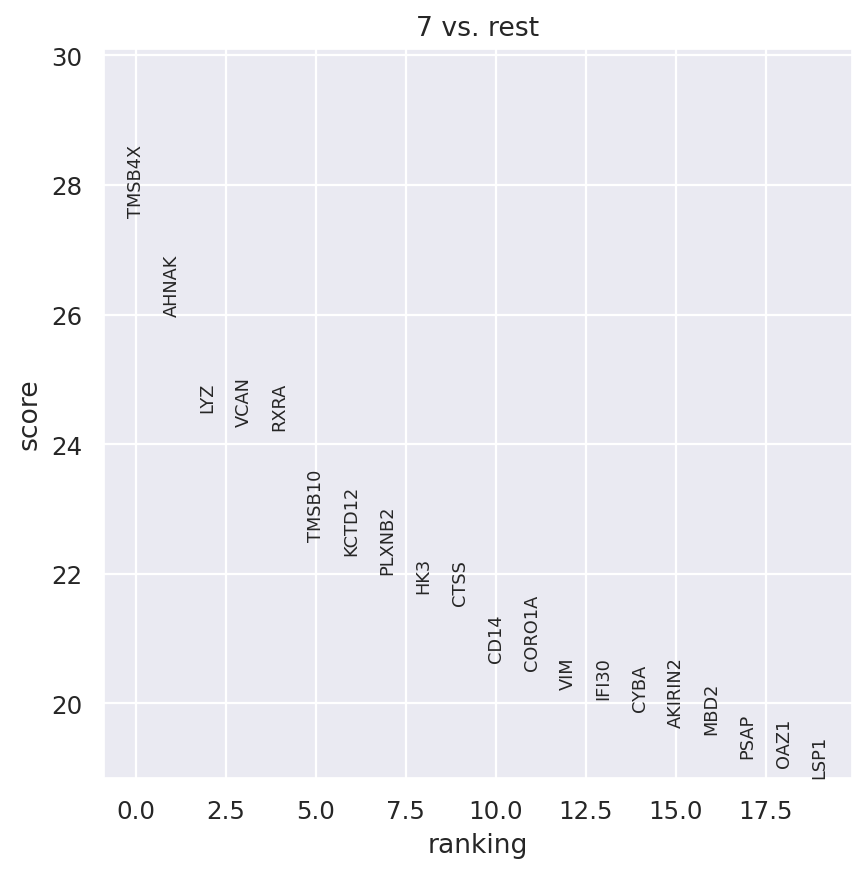

In [94]:
#LYZ AHNAK VCAN RXRA --Monocytes (7)
cluster_7_cells = adata[adata.obs['leiden'] == '7']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['7'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

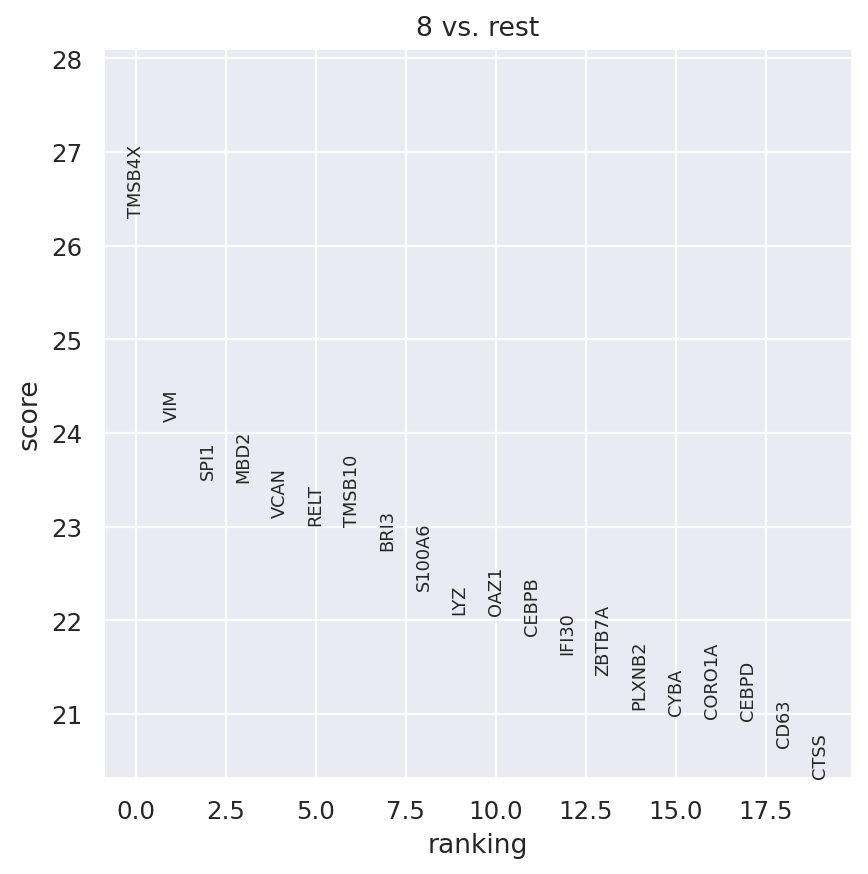

In [133]:
cluster_8_cells = adata[adata.obs['leiden'] == '8']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['8'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

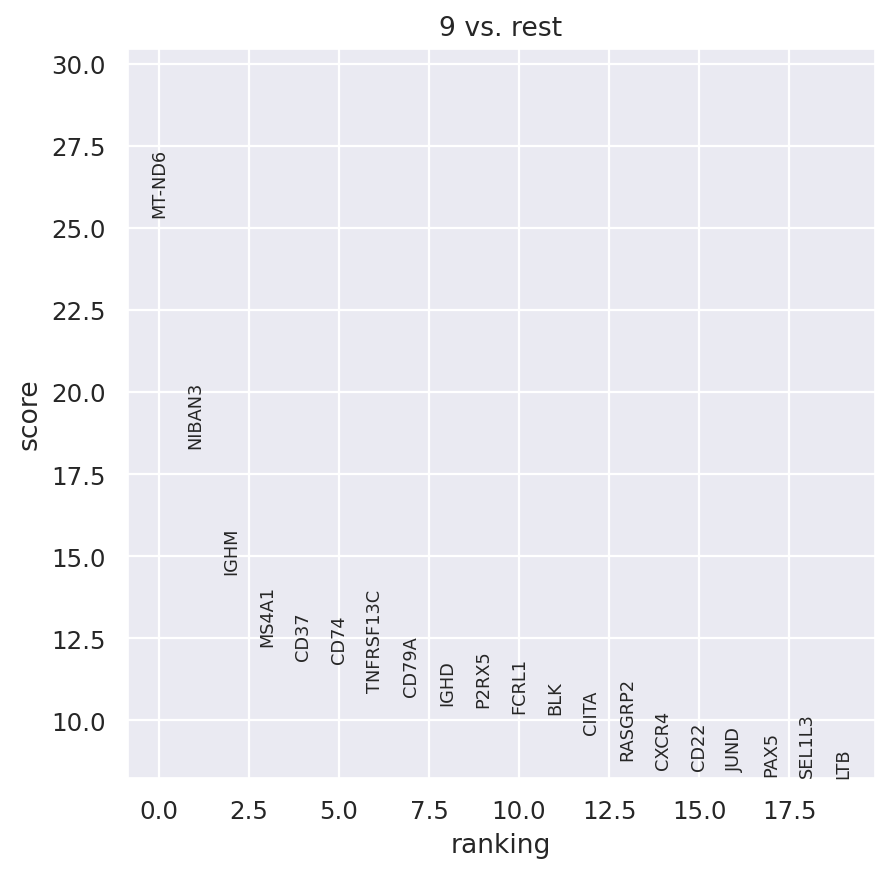

In [130]:
# CD79A CD37 MS4A1(cd20) IGHM(IgM) --B cells(9)
cluster_9_cells = adata[adata.obs['leiden'] == '9']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['9'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

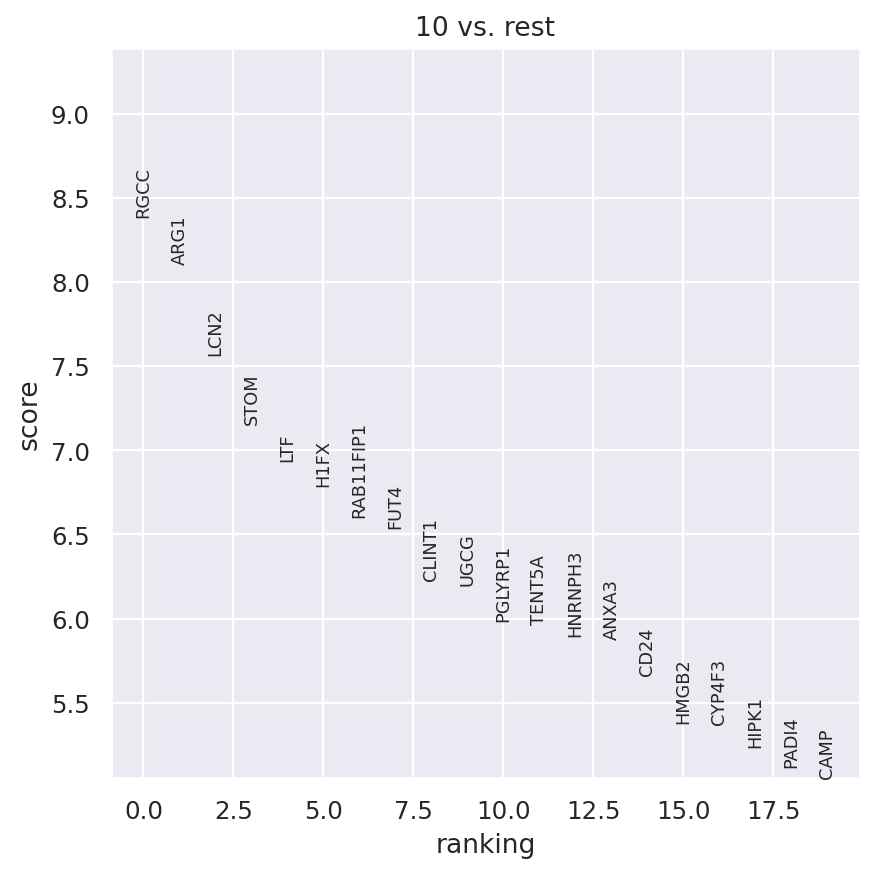

In [95]:
#Neu
cluster_10_cells = adata[adata.obs['leiden'] == '10']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['10'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

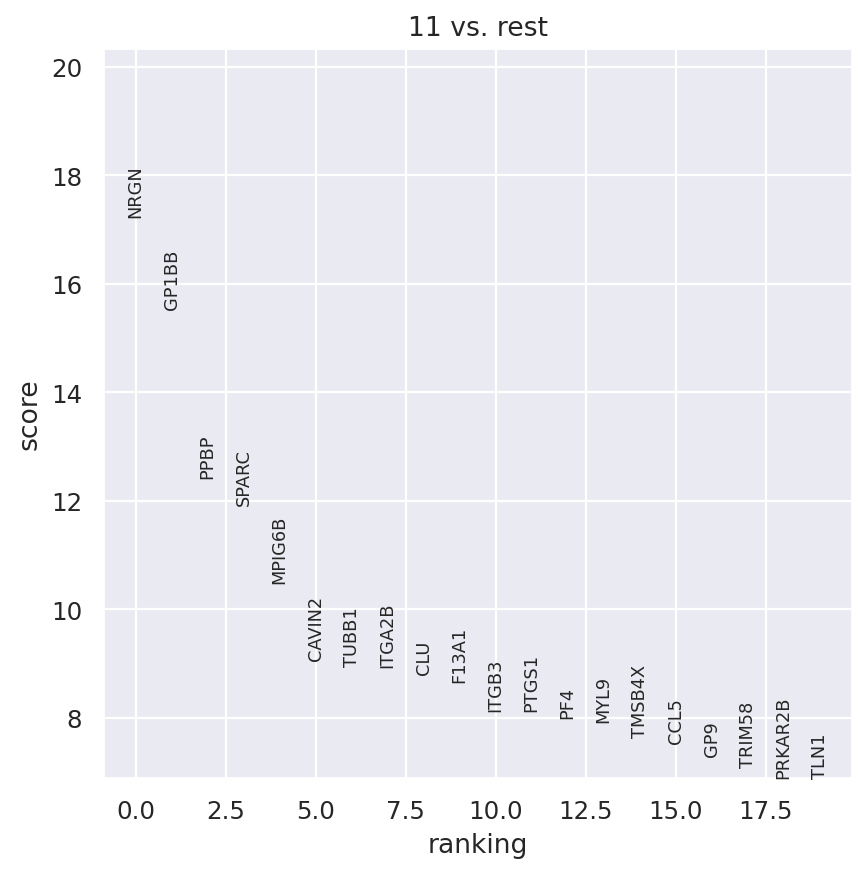

In [96]:
#GP1BB PPBP ITGA2B NRGN -- platelets (11)
cluster_11_cells = adata[adata.obs['leiden'] == '11']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['11'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

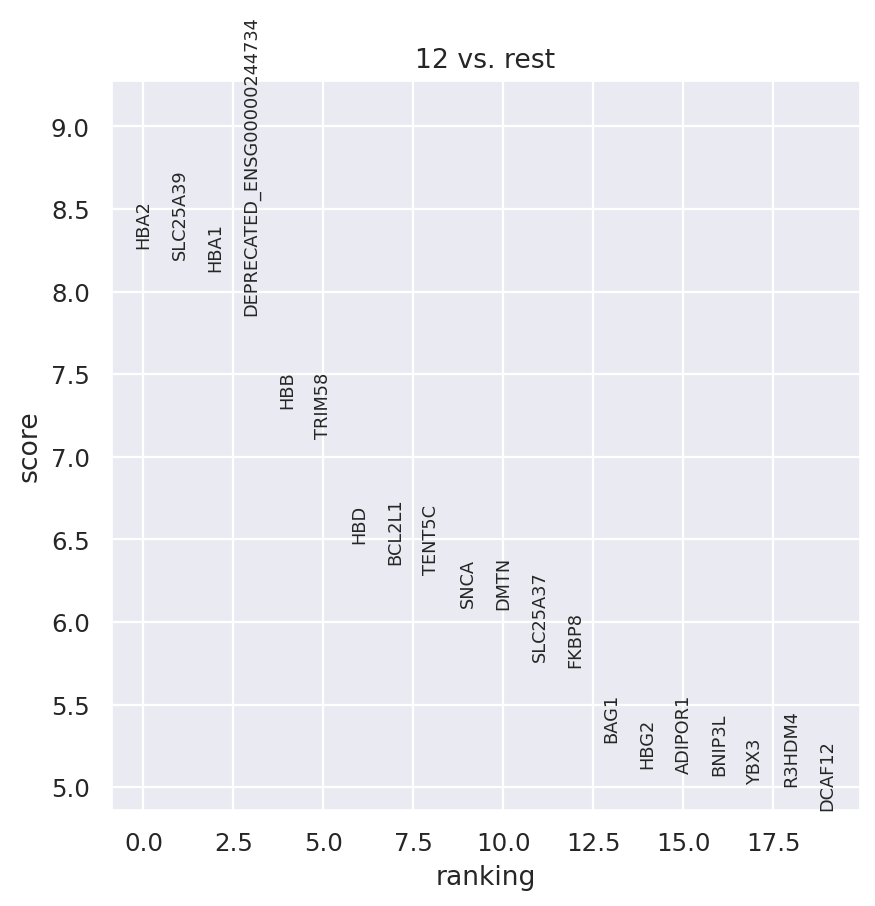

In [97]:
#HBA2 HBA1 HBB -- erythrocytes (12)
cluster_12_cells = adata[adata.obs['leiden'] == '12']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['12'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [134]:
adata.obs['cell_types'] = adata.obs['leiden'].replace({
    '0': 'Neu0',
    '1': 'Neu1',
    '2': 'Neu2',
    '3': 'Neu3',
    '4': 'T naive/memory',
    '5': 'Neu4',
    '6': 'NK',
    '7': 'Monocytes1',
    '8': 'Monocytes2',
    '9': 'B cells',
    '10': 'Neu5',
    '11': 'Platelets',
    '12': 'Erythrocytes',
})

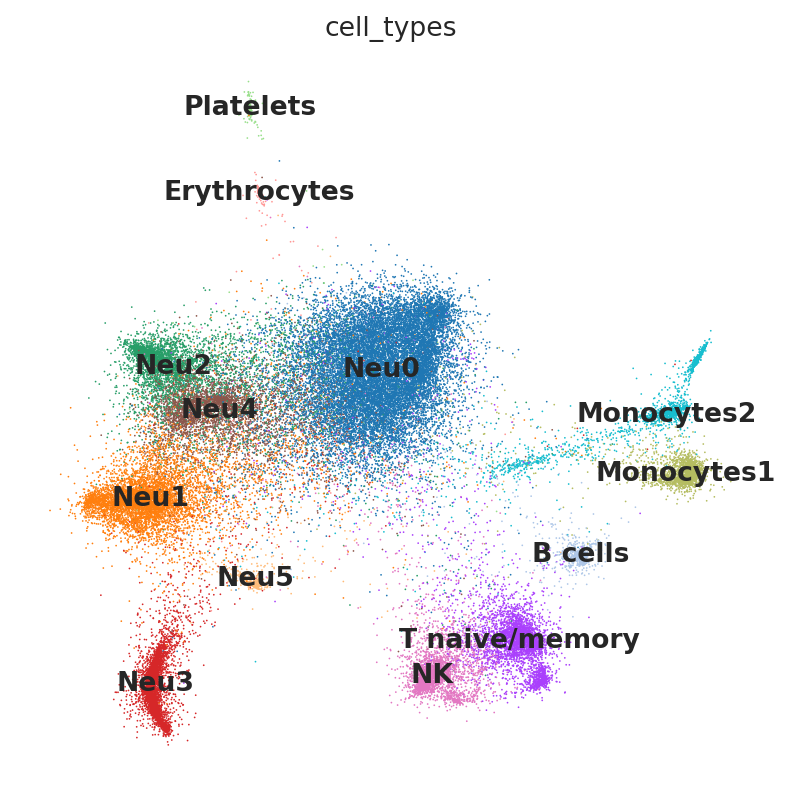

In [135]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['cell_types'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_loc='on data',
    legend_fontsize=12
)

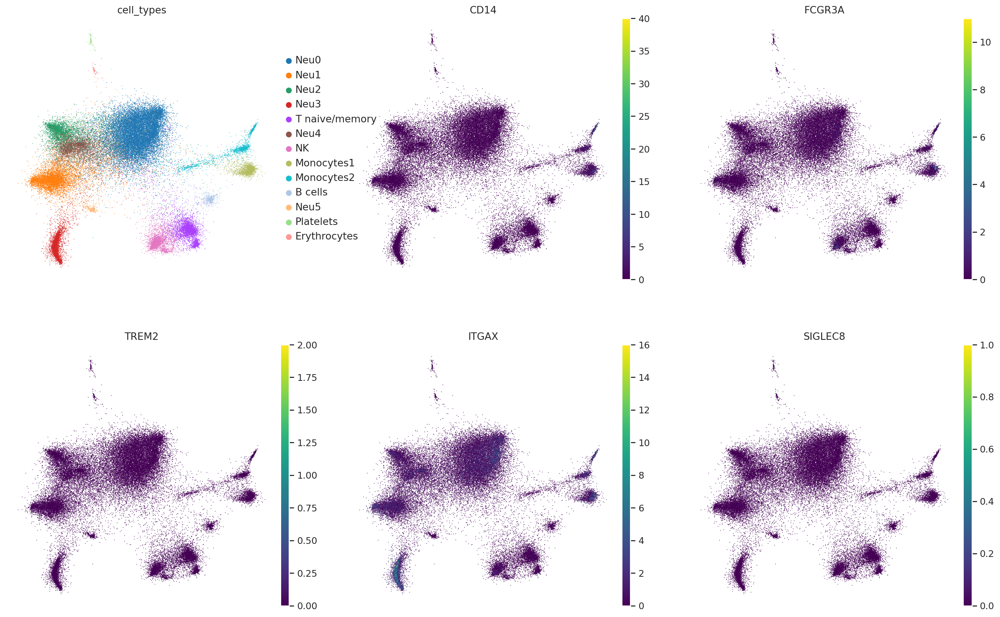

In [136]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['cell_types','CD14','FCGR3A','TREM2','ITGAX','SIGLEC8'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_fontsize=12
)

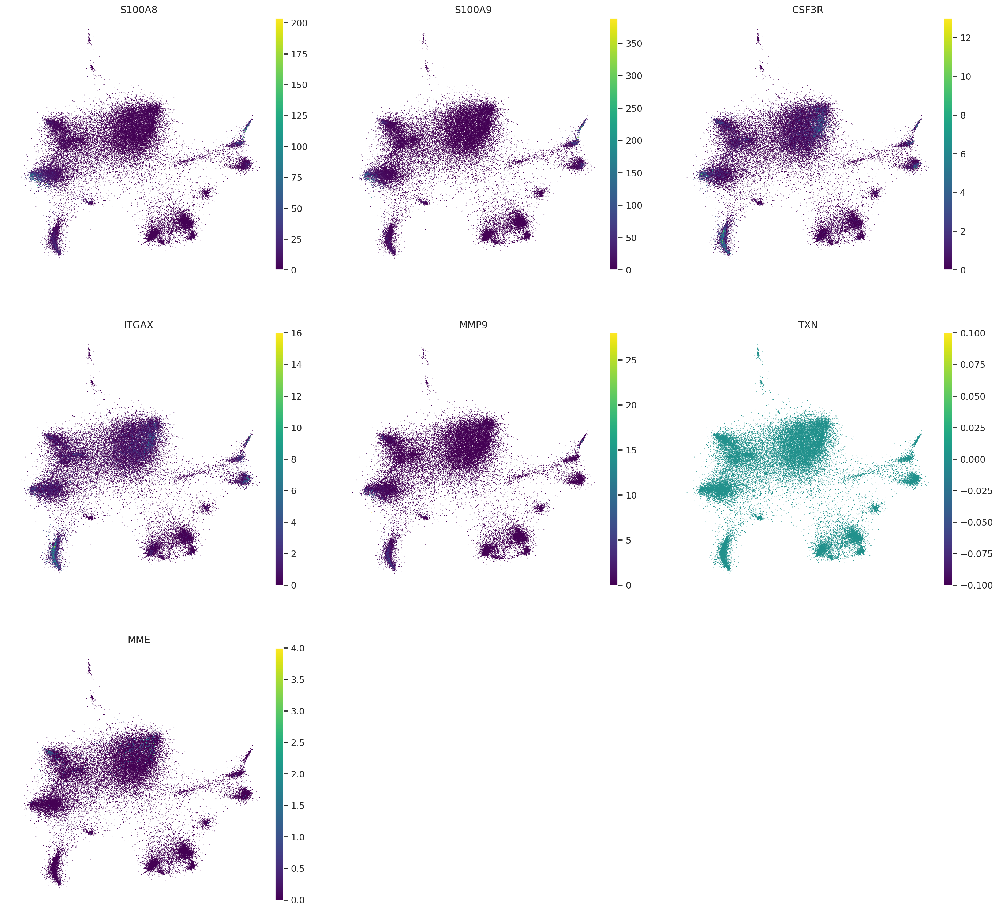

In [137]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['S100A8','S100A9','CSF3R','ITGAX','MMP9','TXN','MME'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_fontsize=12
)

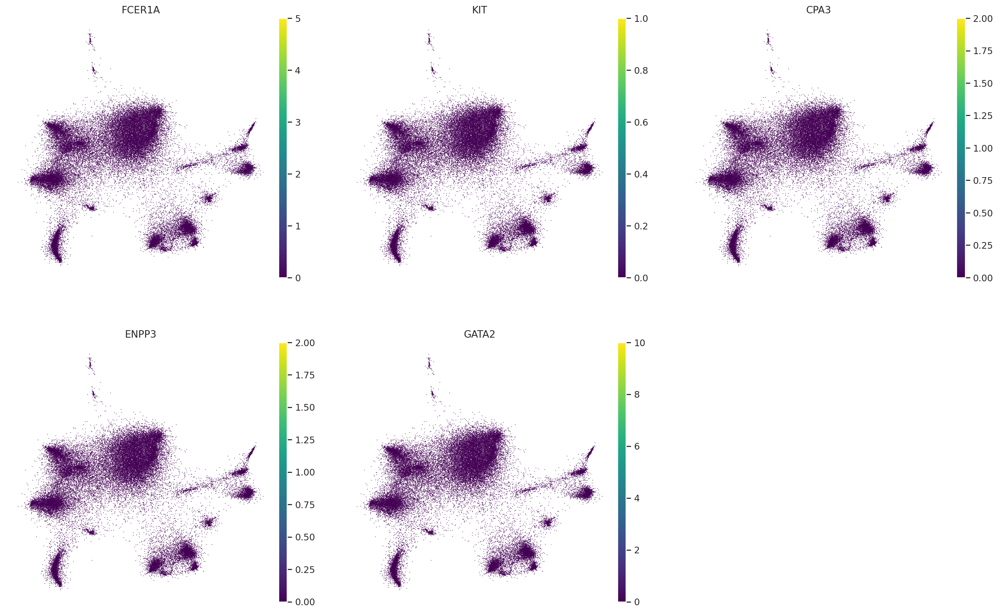

In [128]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['FCER1A','KIT','CPA3','ENPP3','GATA2'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_fontsize=12
)